In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px

In [2]:
solar2=pd.read_csv('/content/df_solar2.csv')
df_srckey_label2 = pd.read_csv('/content/df_srckey_label2.csv')

In [3]:
data= solar2.copy()
data.head()

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,DATE,TIME,DAY,MONTH,WEEK,HOURS,MINUTES,TOTAL MINUTES PASS,DATE_STRING,SOURCE_KEY_NUMBER
0,2020-05-15 00:00,4UPUqMRk7TRMgml,0.0,0.0,9425.000000,2.429011e+06,27.004764,25.060789,0.0,2020-05-15,00:00:00,15,5,20,0,0,0,2020-05-15,0
1,2020-05-15 00:00,81aHJ1q11NBPMrL,0.0,0.0,0.000000,1.215279e+09,27.004764,25.060789,0.0,2020-05-15,00:00:00,15,5,20,0,0,0,2020-05-15,1
2,2020-05-15 00:00,9kRcWv60rDACzjR,0.0,0.0,3075.333333,2.247720e+09,27.004764,25.060789,0.0,2020-05-15,00:00:00,15,5,20,0,0,0,2020-05-15,2
3,2020-05-15 00:00,Et9kgGMDl729KT4,0.0,0.0,269.933333,1.704250e+06,27.004764,25.060789,0.0,2020-05-15,00:00:00,15,5,20,0,0,0,2020-05-15,3
4,2020-05-15 00:00,IQ2d7wF4YD8zU1Q,0.0,0.0,3177.000000,1.994153e+07,27.004764,25.060789,0.0,2020-05-15,00:00:00,15,5,20,0,0,0,2020-05-15,4


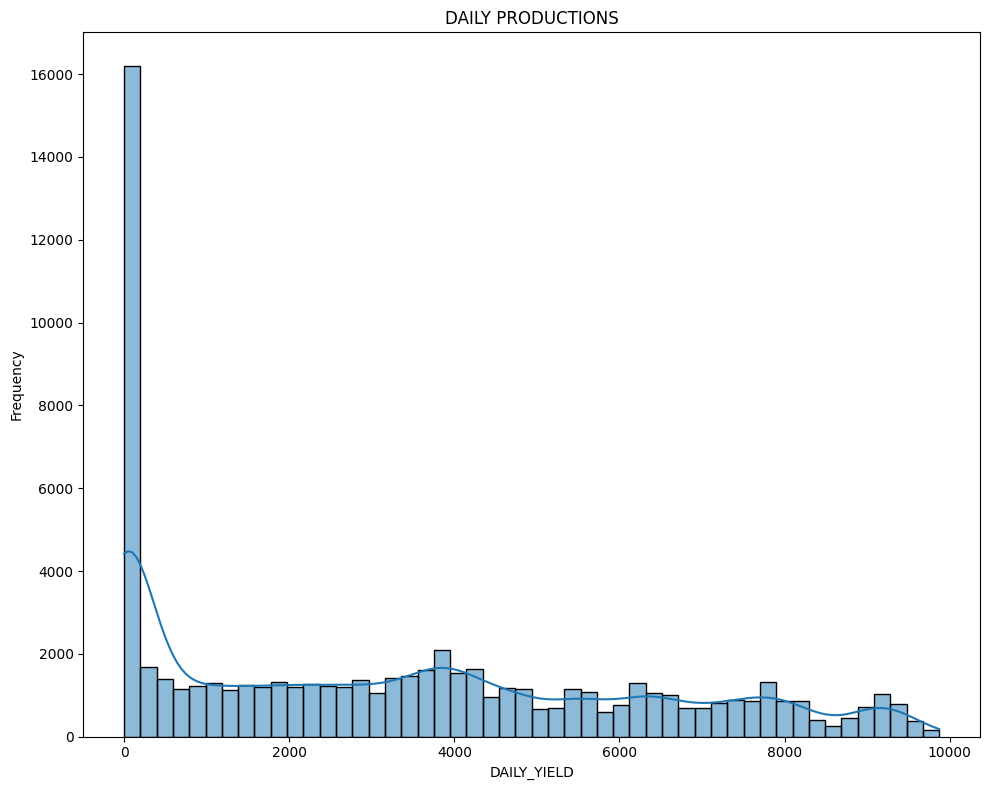

In [4]:
#DAILY PRODUCTIONS
plt.figure(figsize= (10,8))
sns.histplot(x='DAILY_YIELD', data= data, kde= True, bins=50)
plt.title('DAILY PRODUCTIONS')
plt.xlabel('DAILY_YIELD')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

Text(0.5, 0, 'IRRADIATION')

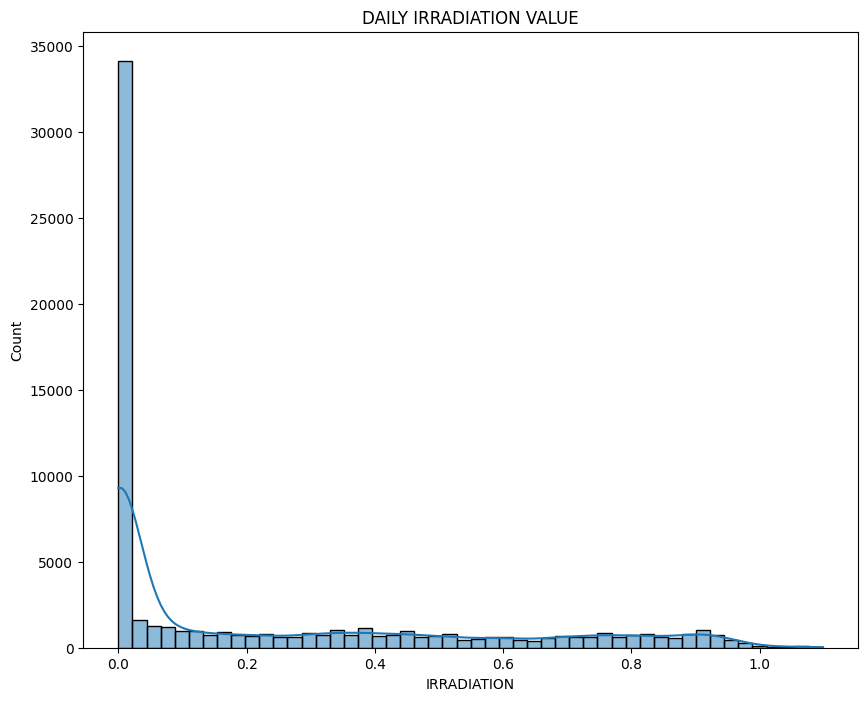

In [5]:
#DAILY IRRADIATION VALUE
plt.figure(figsize= (10,8))
sns.histplot(x='IRRADIATION', data= data, kde= True, bins=50)
plt.title('DAILY IRRADIATION VALUE')
plt.xlabel('IRRADIATION')

majority times its low production of energy and sometimes it spikes showing VOLATILTIY.

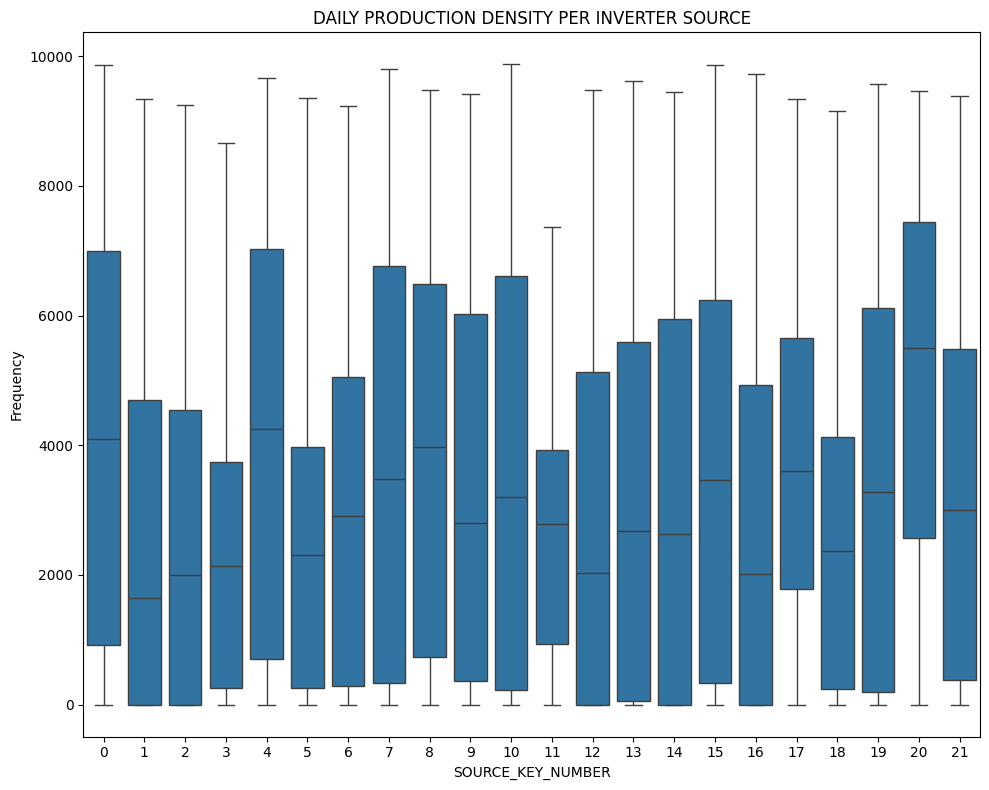

In [6]:
#DAILY PRODUCTION DENSITY PER INVERTER SOURCE
plt.figure(figsize= (10,8))
sns.boxplot(x='SOURCE_KEY_NUMBER', y="DAILY_YIELD", data= data)
plt.title('DAILY PRODUCTION DENSITY PER INVERTER SOURCE')
plt.xlabel('SOURCE_KEY_NUMBER')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

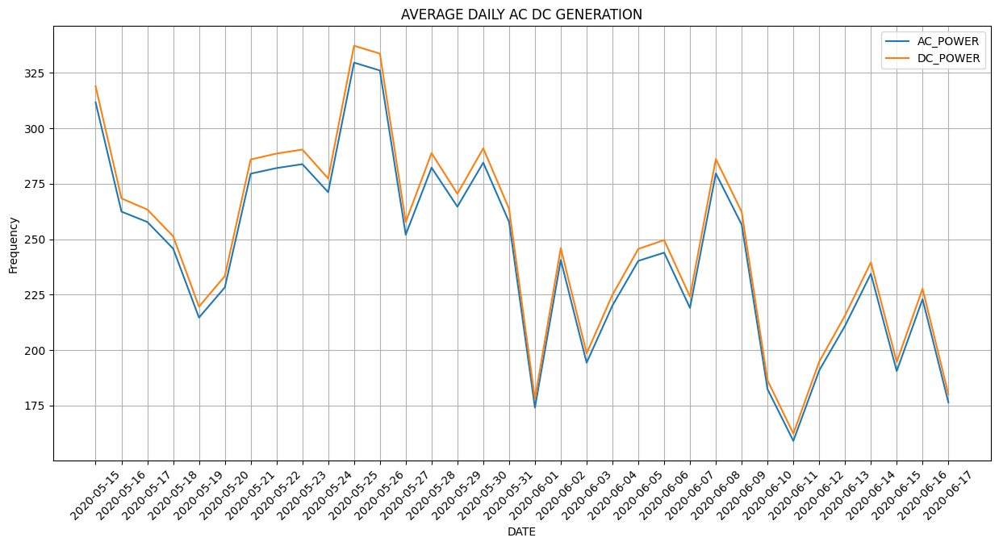

In [7]:
#AVERAGE DAILY AC DC GENERATION
df_avgpower= data.groupby('DATE_STRING')[['AC_POWER', 'DC_POWER']].mean().reset_index()
plt.figure(figsize= (15,7))
plt.plot(df_avgpower['DATE_STRING'], df_avgpower['AC_POWER'], label= 'AC_POWER')
plt.plot(df_avgpower['DATE_STRING'], df_avgpower['DC_POWER'], label= 'DC_POWER')
plt.legend()
plt.title('AVERAGE DAILY AC DC GENERATION')
plt.xlabel('DATE')
plt.xticks(rotation= 45)
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

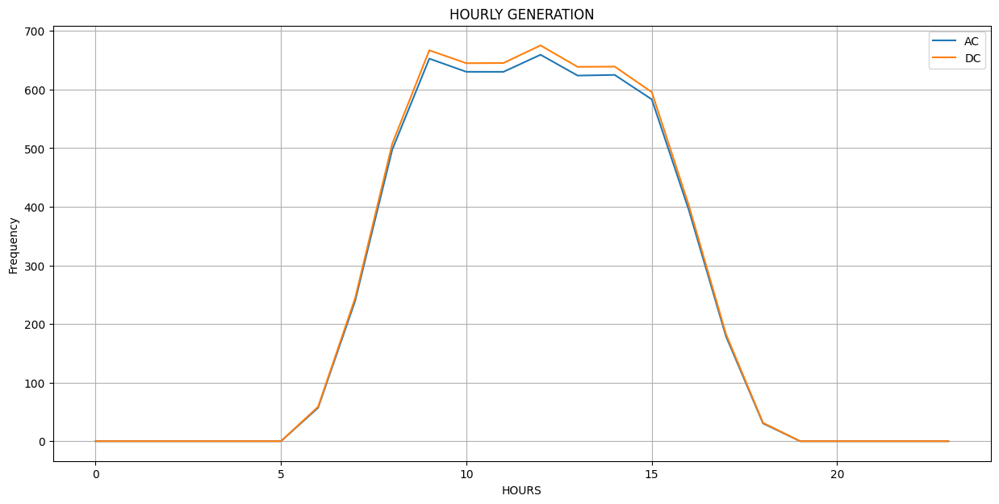

In [8]:
#HOURLY GENERATION
df_hourly= data.groupby('HOURS')[['AC_POWER', 'DC_POWER']].mean().reset_index()
plt.figure(figsize= (15,7))
plt.plot(df_hourly['HOURS'], df_hourly['AC_POWER'], label= 'AC')
plt.plot(df_hourly['HOURS'], df_hourly['DC_POWER'], label= 'DC')
plt.legend()
plt.title('HOURLY GENERATION')
plt.xlabel('HOURS')
plt.ylabel('Frequency')
plt.grid(True)

In [9]:
import plotly.graph_objects as go
fig=go.Figure()
fig.add_trace(go.Scatter(x=data['DATE_TIME'], y=data['AC_POWER'], mode='markers', name='AC Power',
                         marker=dict(size=6, color='blue', opacity=0.7)))

fig.add_trace(go.Scatter(x=data['DATE_TIME'], y=data['DC_POWER'], mode='markers', name='DC Power',
                         marker=dict(size=6, color='red', opacity=0.7)))

fig.update_layout(
    title="AC & DC Power Throughout the Day",
    xaxis_title="Time",
    yaxis_title="Power (kW)",
    hovermode="x",
    plot_bgcolor="white",
    xaxis=dict(showgrid=True, gridcolor='lightgrey'),
    yaxis=dict(showgrid=True, gridcolor='lightgrey')
)

fig.show()


In [10]:
import plotly.express as px


data['DATE_STRING'] = pd.to_datetime(data['DATE_STRING'])
fig = px.scatter(data,
                 x='TIME',
                 y='AC_POWER',
                 animation_frame=data['DATE_STRING'].dt.date,  # Access 'DATE_STRING' column
                 range_y=[data['AC_POWER'].min(), data['AC_POWER'].max()],
                 color='DC_POWER',
                 color_continuous_scale='Reds')
fig.update_traces(mode='lines+markers')

fig.update_layout(
    title="CHANGES IN AC POWER THOROUHOUT THE DAY",
    xaxis_title="Time",
    yaxis_title="Power (kW)",
    hovermode="x"
)
fig.show()

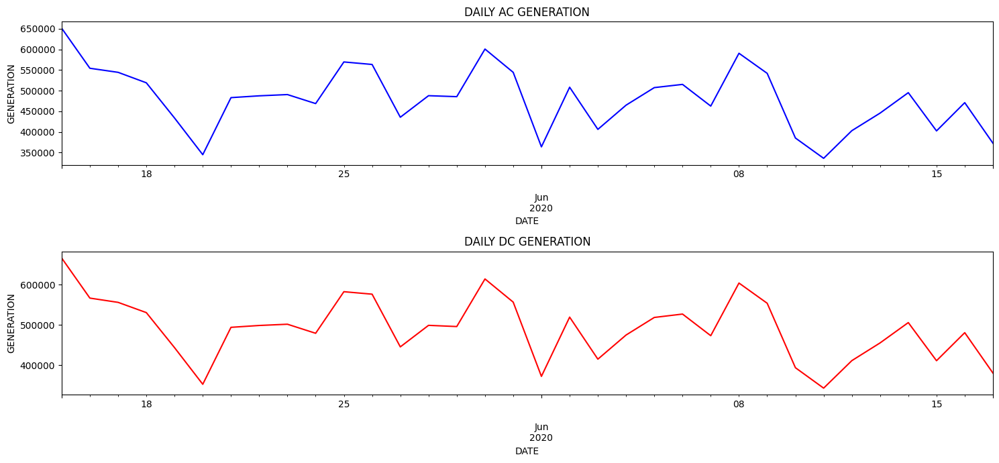

In [11]:
#TOTAL DAILY GENERATION
df_= data.groupby('DATE_STRING').sum()

fig, ax = plt.subplots(2,1, figsize= (15,7))
df_["AC_POWER"].plot(ax=ax[0] ,color='blue', title="DAILY AC GENERATION")
df_["DC_POWER"].plot(ax=ax[1] ,color='red', title="DAILY DC GENERATION")
for axi in ax.flat:
    axi.set(xlabel='DATE', ylabel='GENERATION')
    plt.tight_layout()

<Figure size 1500x700 with 0 Axes>

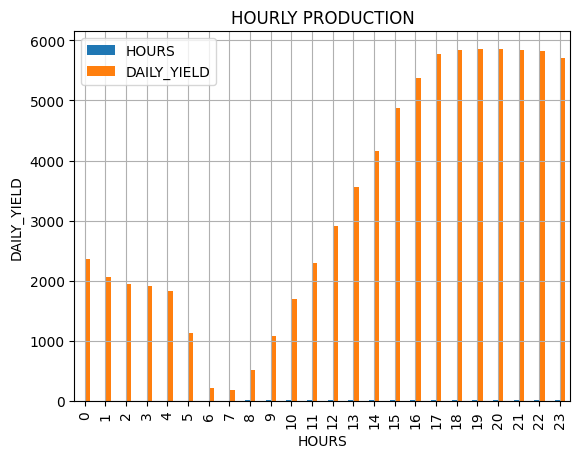

In [12]:
hourly_yield= data.groupby('HOURS')['DAILY_YIELD'].mean().reset_index()
plt.figure(figsize= (15,7))
hourly_yield.plot(kind="bar")
plt.title('HOURLY PRODUCTION')
plt.xlabel('HOURS')
plt.ylabel('DAILY_YIELD')
plt.grid(True)


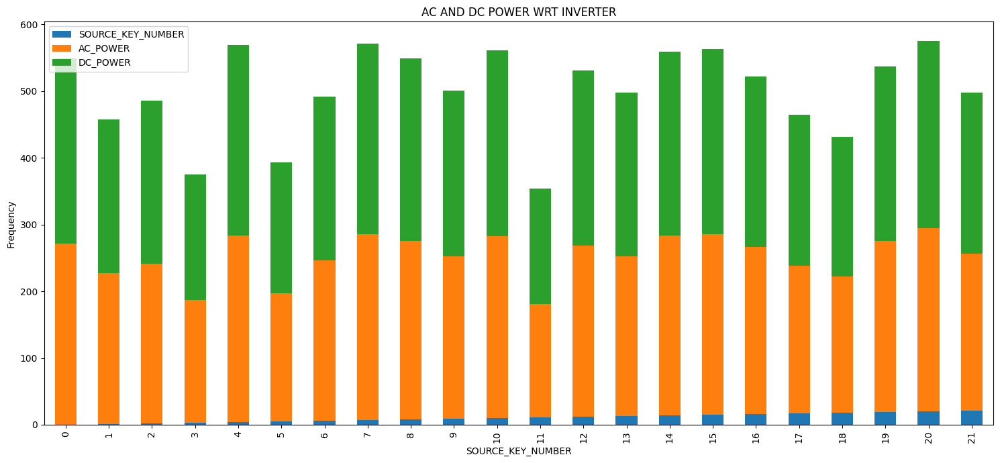

In [13]:
#AC AND DC POWER WRT INVERTER
df_acdc_src= data.groupby('SOURCE_KEY_NUMBER')[['AC_POWER', 'DC_POWER']].mean().reset_index()
df_acdc_src= df_acdc_src.sort_values('SOURCE_KEY_NUMBER').plot(kind= 'bar', stacked=True, figsize= (15,7))
plt.title('AC AND DC POWER WRT INVERTER')
plt.xlabel('SOURCE_KEY_NUMBER')
plt.ylabel('Frequency')
plt.grid(False)
plt.tight_layout()
plt.show()

In [14]:
data.head()

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,DATE,TIME,DAY,MONTH,WEEK,HOURS,MINUTES,TOTAL MINUTES PASS,DATE_STRING,SOURCE_KEY_NUMBER
0,2020-05-15 00:00,4UPUqMRk7TRMgml,0.0,0.0,9425.000000,2.429011e+06,27.004764,25.060789,0.0,2020-05-15,00:00:00,15,5,20,0,0,0,2020-05-15,0
1,2020-05-15 00:00,81aHJ1q11NBPMrL,0.0,0.0,0.000000,1.215279e+09,27.004764,25.060789,0.0,2020-05-15,00:00:00,15,5,20,0,0,0,2020-05-15,1
2,2020-05-15 00:00,9kRcWv60rDACzjR,0.0,0.0,3075.333333,2.247720e+09,27.004764,25.060789,0.0,2020-05-15,00:00:00,15,5,20,0,0,0,2020-05-15,2
3,2020-05-15 00:00,Et9kgGMDl729KT4,0.0,0.0,269.933333,1.704250e+06,27.004764,25.060789,0.0,2020-05-15,00:00:00,15,5,20,0,0,0,2020-05-15,3
4,2020-05-15 00:00,IQ2d7wF4YD8zU1Q,0.0,0.0,3177.000000,1.994153e+07,27.004764,25.060789,0.0,2020-05-15,00:00:00,15,5,20,0,0,0,2020-05-15,4


In [15]:
import plotly.express as px
import plotly.subplots as sp

# Create two figures for AC_POWER and DC_POWER
fig1 = px.scatter(data, x="SOURCE_KEY", y="AC_POWER", animation_frame="HOURS", range_y=[data["AC_POWER"].min(), data["AC_POWER"].max()])
fig2 = px.scatter(data, x="SOURCE_KEY", y="DC_POWER", animation_frame="HOURS", range_y=[data["DC_POWER"].min(), data["DC_POWER"].max()])
fig1.show(), fig2.show()


(None, None)

In [16]:
#MAPPING INVERTER SOURCE KEY
df_srckey_label2.reset_index(inplace= True)
df_srckey_label2.head()


,index,SOURCE_KEY
0,0,4UPUqMRk7TRMgml
1,1,81aHJ1q11NBPMrL
2,2,9kRcWv60rDACzjR
3,3,Et9kgGMDl729KT4
4,4,IQ2d7wF4YD8zU1Q


In [17]:
data['SOURCE_KEY'] = data['SOURCE_KEY_NUMBER'].map(df_srckey_label2['SOURCE_KEY'])


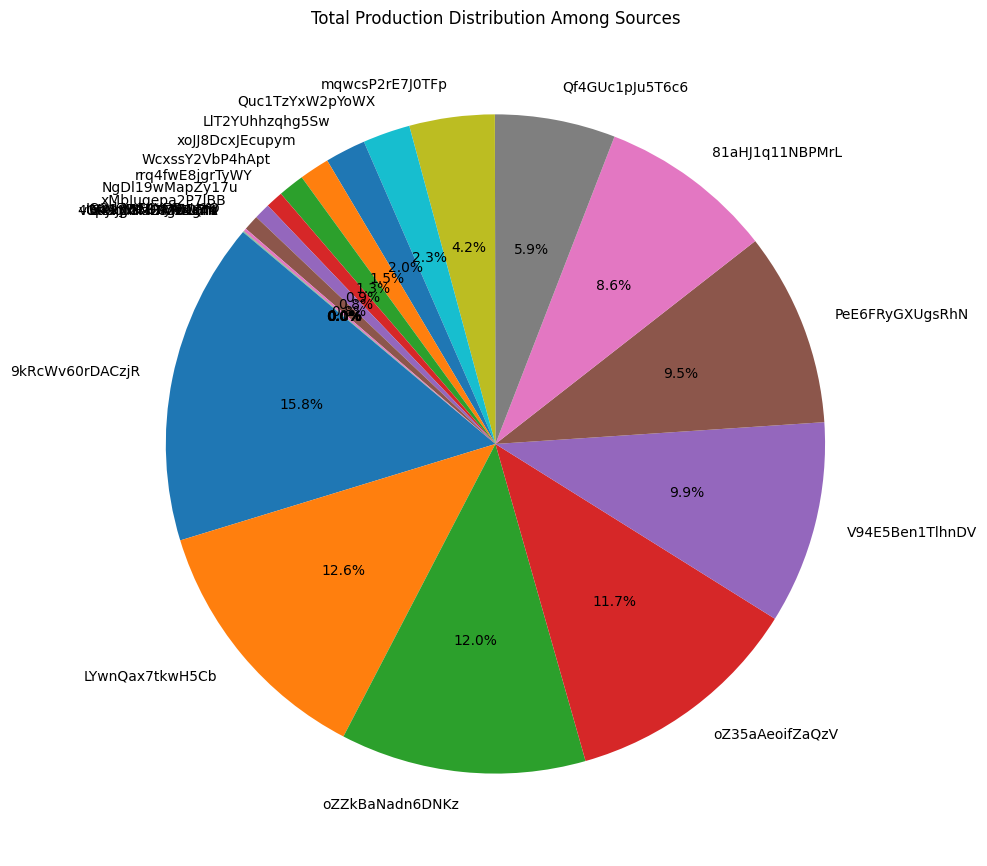

In [18]:
#TOTAL PRODUCTION AMONGST SOURCES
grouped_total_yield = data.groupby('SOURCE_KEY')['TOTAL_YIELD'].last()

plt.figure(figsize=(10,10))
grouped_total_yield.sort_values(ascending=False).plot(kind='pie', autopct='%1.1f%%', startangle=140)
plt.title('Total Production Distribution Among Sources')
plt.ylabel('')
plt.tight_layout()
plt.show()


In [19]:
data.columns

Index(['DATE_TIME', 'SOURCE_KEY', 'DC_POWER', 'AC_POWER', 'DAILY_YIELD',
       'TOTAL_YIELD', 'AMBIENT_TEMPERATURE', 'MODULE_TEMPERATURE',
       'IRRADIATION', 'DATE', 'TIME', 'DAY', 'MONTH', 'WEEK', 'HOURS',
       'MINUTES', 'TOTAL MINUTES PASS', 'DATE_STRING', 'SOURCE_KEY_NUMBER'],
      dtype='object')

In [20]:
import plotly.express as px

fig = px.line(data, x='DATE_STRING', y='DC_POWER', color='SOURCE_KEY',
              title='DC Power per Source', markers=True, line_shape='linear')

fig.update_layout(
    xaxis_title="Date-Time",
    yaxis_title="DC Power (kW)",
    legend_title="Source Key",
    xaxis=dict(tickangle=-45)
)

fig.show()

In [21]:
data.head()

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,DATE,TIME,DAY,MONTH,WEEK,HOURS,MINUTES,TOTAL MINUTES PASS,DATE_STRING,SOURCE_KEY_NUMBER
0,2020-05-15 00:00,4UPUqMRk7TRMgml,0.0,0.0,9425.000000,2.429011e+06,27.004764,25.060789,0.0,2020-05-15,00:00:00,15,5,20,0,0,0,2020-05-15,0
1,2020-05-15 00:00,81aHJ1q11NBPMrL,0.0,0.0,0.000000,1.215279e+09,27.004764,25.060789,0.0,2020-05-15,00:00:00,15,5,20,0,0,0,2020-05-15,1
2,2020-05-15 00:00,9kRcWv60rDACzjR,0.0,0.0,3075.333333,2.247720e+09,27.004764,25.060789,0.0,2020-05-15,00:00:00,15,5,20,0,0,0,2020-05-15,2
3,2020-05-15 00:00,Et9kgGMDl729KT4,0.0,0.0,269.933333,1.704250e+06,27.004764,25.060789,0.0,2020-05-15,00:00:00,15,5,20,0,0,0,2020-05-15,3
4,2020-05-15 00:00,IQ2d7wF4YD8zU1Q,0.0,0.0,3177.000000,1.994153e+07,27.004764,25.060789,0.0,2020-05-15,00:00:00,15,5,20,0,0,0,2020-05-15,4


In [22]:
#WEEKLY PRODUCTION
data['DATE_STRING'] = pd.to_datetime(data['DATE_STRING'])
data = data.set_index('DATE_STRING')

# Now you can resample
weekly_production = data.resample('W-Mon').sum(numeric_only=True)
fig = px.bar(weekly_production, x=weekly_production.index, y="DAILY_YIELD",
             title='Weekly Production',
             labels={'DAILY_YIELD': 'Total Production (kW)', 'index': 'Date'},
             color="DAILY_YIELD",
             color_continuous_scale="Viridis",
             hover_name=weekly_production.index,
             hover_data={"DAILY_YIELD": True}
            )

fig.update_layout(
    plot_bgcolor="white",
    title_font=dict(size=24, family="Arial", color="black"),
    xaxis_title_font=dict(size=18, family="Arial", color="grey"),
    yaxis_title_font=dict(size=18, family="Arial", color="grey"),
    xaxis_tickfont=dict(size=12, family="Arial", color="grey"),
    yaxis_tickfont=dict(size=12, family="Arial", color="grey"),
    bargap=0.1
)

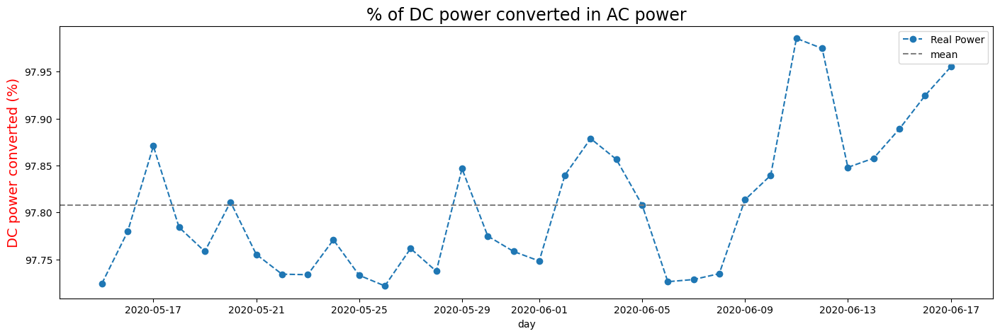

In [23]:
# % OF DC CONVERTED TO AC

losses_1 = data.copy()
losses_1['day'] = losses_1.index.date
losses_1 = losses_1.groupby('day').sum(numeric_only=True)
losses_1['losses'] = losses_1['AC_POWER'] / losses_1['DC_POWER'] * 100

plt.figure(figsize=(17, 5))
losses_1['losses'].plot(style='o--', label='Real Power')
plt.title('% of DC power converted in AC power', size=17)
plt.ylabel('DC power converted (%)', fontsize=14, color='red')
plt.axhline(losses_1['losses'].mean(), linestyle='--', color='gray', label='mean')
plt.legend()
plt.show()

**WEATHER ANALYSIS**

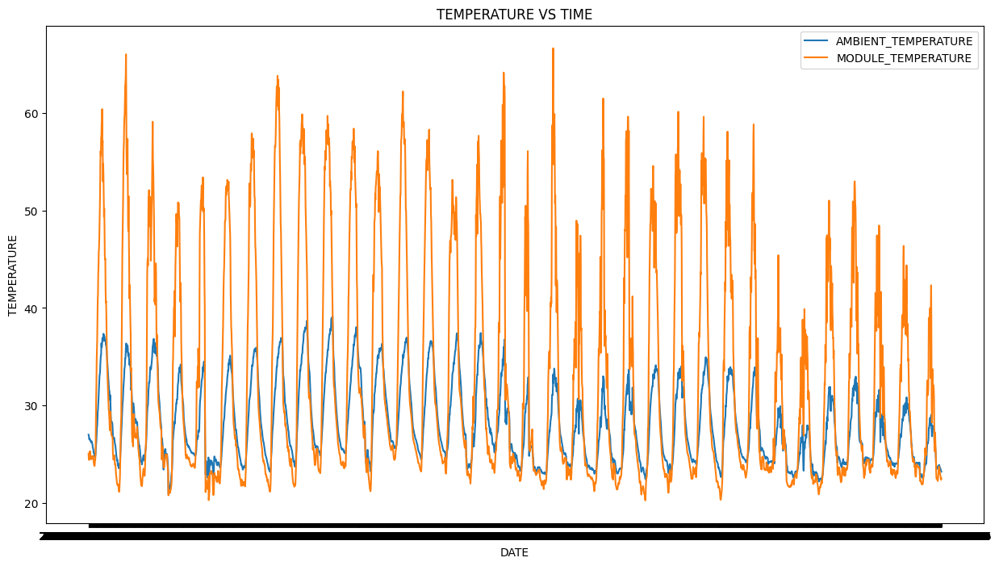

In [24]:
#TEMPERATURE VS TIME
plt.figure(figsize=(15,8))
plt.plot(data['DATE_TIME'], data['AMBIENT_TEMPERATURE'], label='AMBIENT_TEMPERATURE')
plt.plot(data['DATE_TIME'], data['MODULE_TEMPERATURE'], label='MODULE_TEMPERATURE')
plt.title('TEMPERATURE VS TIME')
plt.xlabel('DATE')
plt.ylabel('TEMPERATURE')
plt.legend()
plt.show()

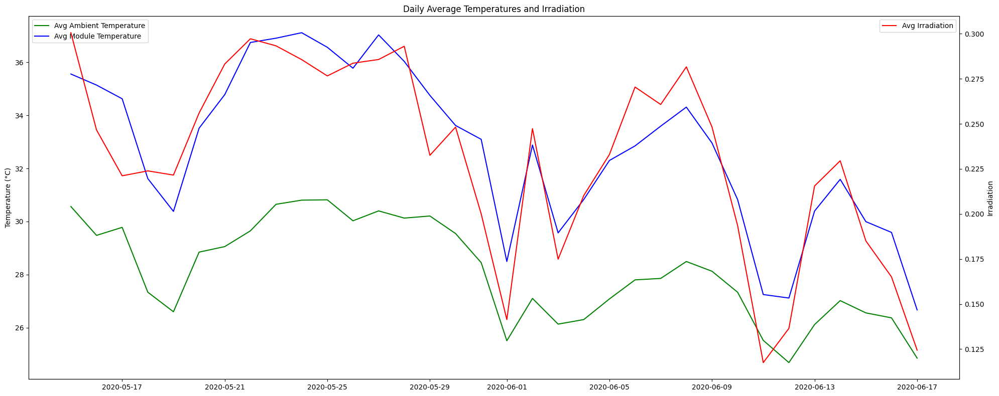

In [25]:
#TEMPERATURE VS IRRADIATON
data['DATE_TIME'] = pd.to_datetime(data['DATE_TIME'])

data['DAY'] = data['DATE_TIME'].dt.date

daily_avg = data.groupby('DAY').mean(numeric_only=True)

fig, ax1 = plt.subplots(figsize=(20, 8))

ax2 = ax1.twinx()

ax1.plot(daily_avg.index, daily_avg['AMBIENT_TEMPERATURE'], 'g-', label='Avg Ambient Temperature')
ax1.plot(daily_avg.index, daily_avg['MODULE_TEMPERATURE'], 'b-', label='Avg Module Temperature')
ax2.plot(daily_avg.index, daily_avg['IRRADIATION'], 'r-', label='Avg Irradiation')

ax1.set_ylabel('Temperature (°C)', color='black')
ax2.set_ylabel('Irradiation', color='black')

plt.title('Daily Average Temperatures and Irradiation')
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
fig.tight_layout()

plt.show()

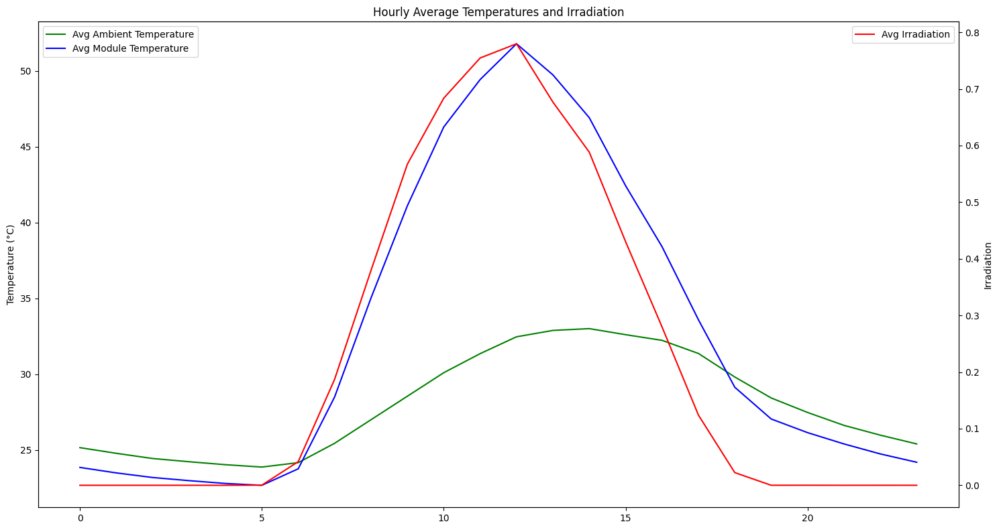

In [26]:
#AVG HOURLY TEMP VS IRRADIATION
hourly_df= data.groupby("HOURS").mean(numeric_only=True)
fig,ax1= plt.subplots(figsize=(15,8))
# Create a second y-axis sharing the same x-axis
ax2 = ax1.twinx()
ax1.plot(hourly_df.index, hourly_df['AMBIENT_TEMPERATURE'], 'g-', label='Avg Ambient Temperature')
ax1.plot(hourly_df.index, hourly_df['MODULE_TEMPERATURE'], 'b-', label='Avg Module Temperature')
ax2.plot(hourly_df.index, hourly_df['IRRADIATION'], 'r-', label='Avg Irradiation')

ax1.set_ylabel("Temperature (°C)", color="black")
ax2.set_ylabel("Irradiation", color="black")

plt.title("Hourly Average Temperatures and Irradiation")
ax1.legend(loc="upper left")
ax2.legend(loc="upper right")
fig.tight_layout()
plt.show()

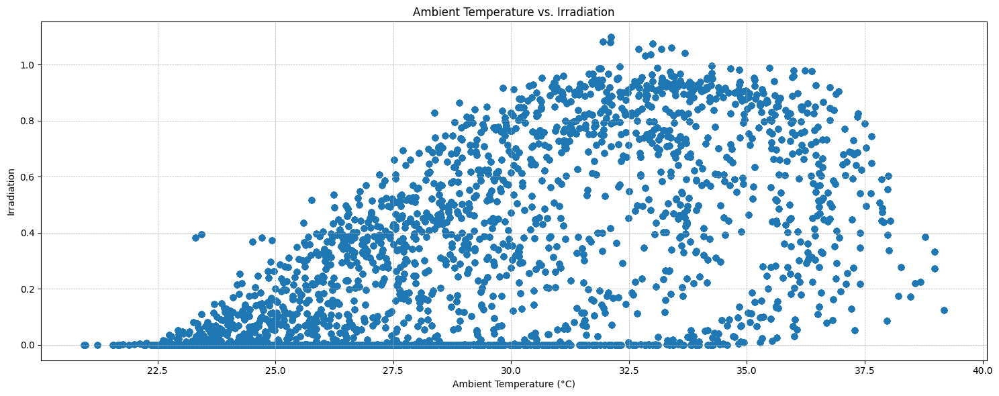

In [27]:
#AMBIENT TEMP VS IRRADIATION

plt.figure(figsize=(15, 6))
plt.scatter(data['AMBIENT_TEMPERATURE'], data['IRRADIATION'], alpha=0.5)
plt.title('Ambient Temperature vs. Irradiation')
plt.xlabel('Ambient Temperature (°C)')
plt.ylabel('Irradiation')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

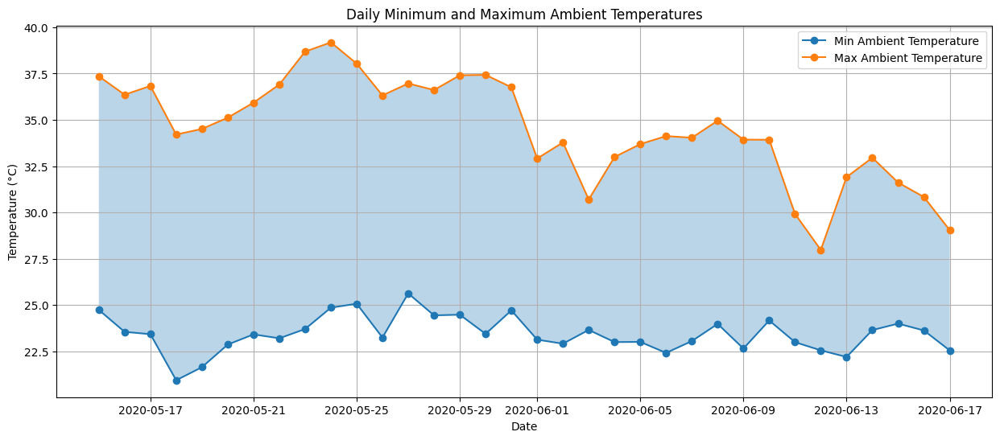

In [28]:
#DAILY MIN AND MAX AMBIENT TEMPERATURE
daily_min_max = data.groupby('DAY').agg({'AMBIENT_TEMPERATURE': ['min', 'max']})

plt.figure(figsize=(15, 6))
plt.plot(daily_min_max.index, daily_min_max['AMBIENT_TEMPERATURE']['min'], label='Min Ambient Temperature',marker='o')
plt.plot(daily_min_max.index, daily_min_max['AMBIENT_TEMPERATURE']['max'], label='Max Ambient Temperature',marker='o')
plt.fill_between(daily_min_max.index, daily_min_max['AMBIENT_TEMPERATURE']['min'], daily_min_max['AMBIENT_TEMPERATURE']['max'], alpha=0.3)
plt.title('Daily Minimum and Maximum Ambient Temperatures')
plt.xlabel('Date')
plt.ylabel('Temperature (°C)')
plt.legend()
plt.grid(True)
plt.show()

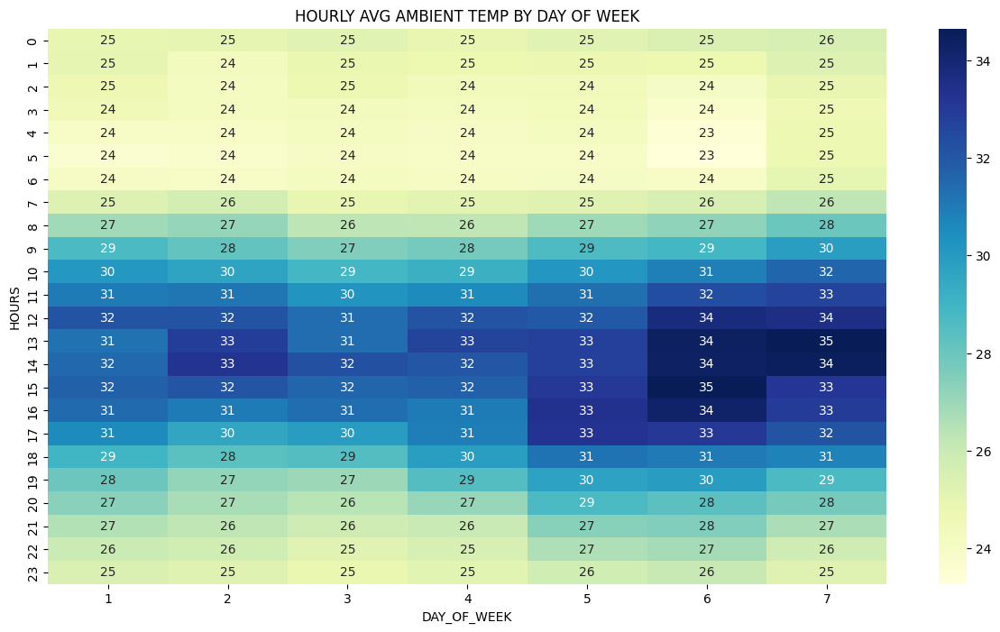

In [29]:
#HOURLY AVG AMBIENT TEMP BY DAY OF WEEK
data['DAY_OF_WEEK'] = data['DATE_TIME'].dt.dayofweek +1
pivot_= data.pivot_table(index='HOURS', columns='DAY_OF_WEEK', values='AMBIENT_TEMPERATURE', aggfunc='mean')
plt.figure(figsize=(15,8))
sns.heatmap(pivot_, cmap='YlGnBu',annot=True)

plt.title('HOURLY AVG AMBIENT TEMP BY DAY OF WEEK')
plt.show()

<Axes: xlabel='DAY_OF_WEEK', ylabel='HOURS'>

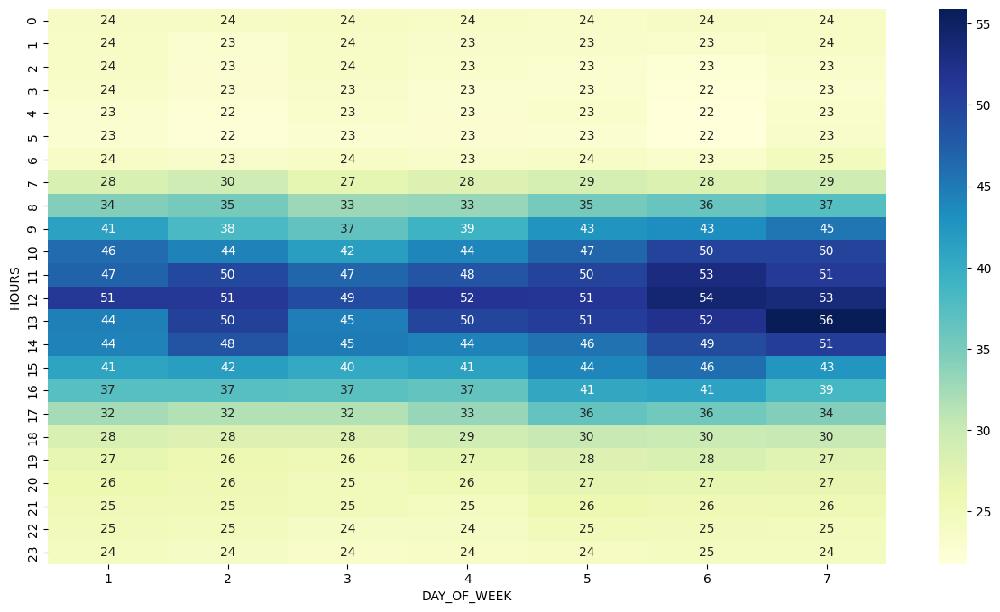

In [30]:
#DAY OF WEEK VS MODULE TEMPERATURE
piovot_= data.pivot_table(index='HOURS', columns='DAY_OF_WEEK', values='MODULE_TEMPERATURE', aggfunc='mean')
plt.figure(figsize=(15,8))
sns.heatmap(piovot_, cmap='YlGnBu',annot=True)


<Axes: xlabel='DAY_OF_WEEK', ylabel='HOURS'>

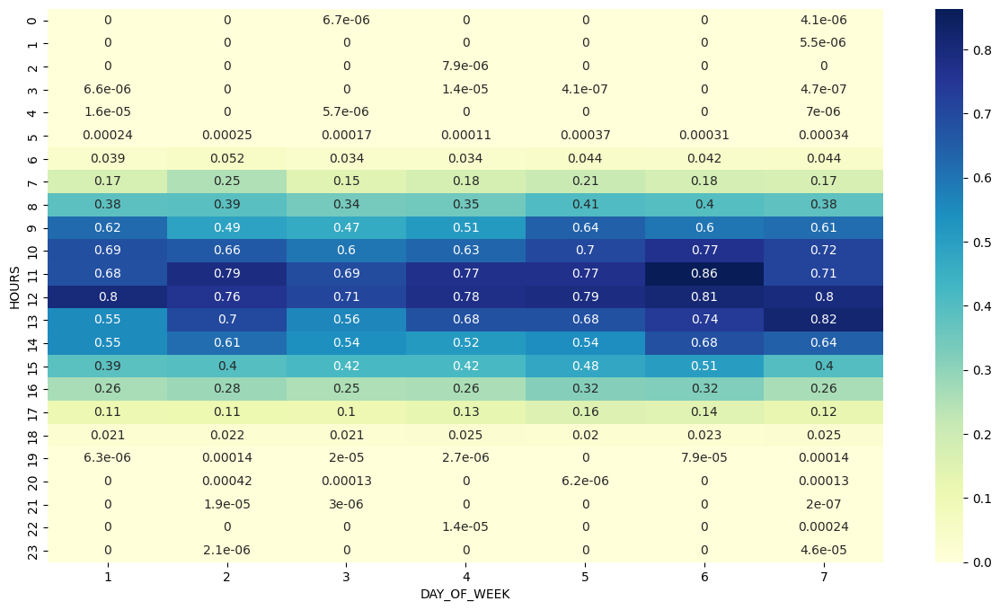

In [31]:
#DAY OF WEEK VS IRRADIATION
piovot_= data.pivot_table(index='HOURS', columns='DAY_OF_WEEK', values='IRRADIATION',aggfunc='mean')

plt.figure(figsize=(15,8))
sns.heatmap(piovot_, cmap='YlGnBu',annot=True)

<Axes: >

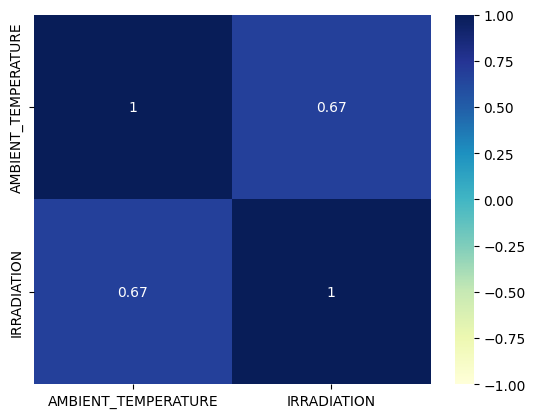

In [32]:
#CORRELATION BETWEEN AMBIENT TEMP AND IRRADIATION
corr= data[['AMBIENT_TEMPERATURE', 'IRRADIATION']].corr()
sns.heatmap(corr, annot=True, cmap='YlGnBu', vmin= -1 ,vmax= 1)


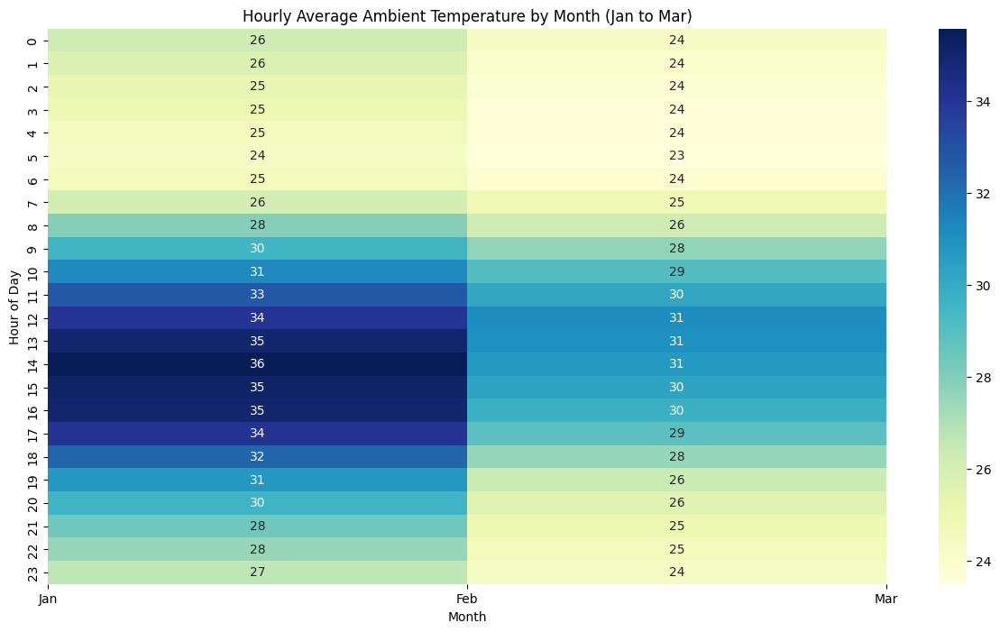

In [33]:
#HOURLY AVG AMBIENT TEMP BY MONTH(JAN TO MARCH)
data['MONTH'] = data['DATE_TIME'].dt.month
pivot_= data.pivot_table(index='HOURS', columns='MONTH', values='AMBIENT_TEMPERATURE', aggfunc='mean')
plt.figure(figsize=(15,8))
sns.heatmap(pivot_, cmap='YlGnBu',annot=True)

plt.title('Hourly Average Ambient Temperature by Month (Jan to Mar)')
plt.xlabel('Month')
plt.ylabel('Hour of Day')
plt.xticks(ticks=range(0,3), labels=['Jan', 'Feb', 'Mar'])
plt.show()

<Axes: >

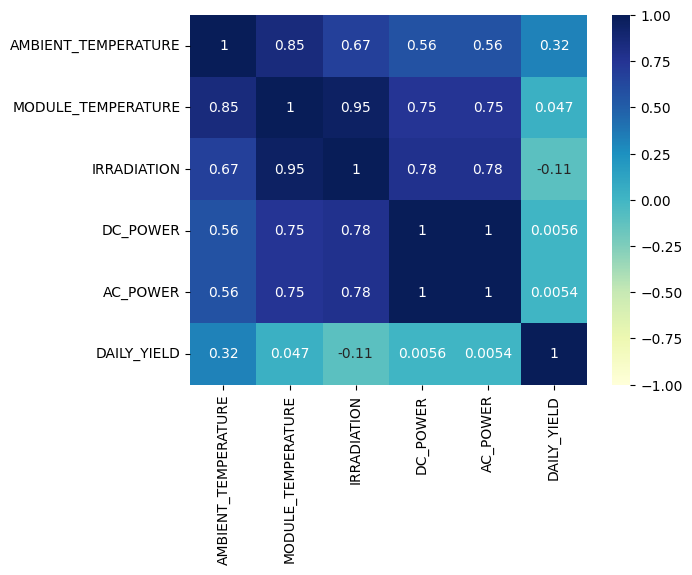

In [34]:
#correlation
corr= data[['AMBIENT_TEMPERATURE', 'MODULE_TEMPERATURE' ,'IRRADIATION' ,"DC_POWER", "AC_POWER", "DAILY_YIELD" ]].corr()
sns.heatmap(corr, annot=True, cmap='YlGnBu', vmin= -1 ,vmax= 1)

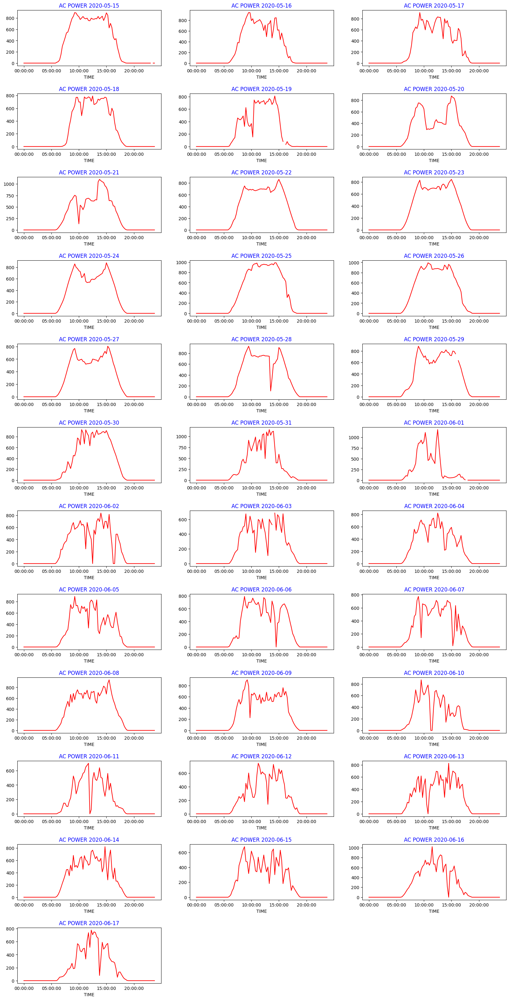

In [35]:
#MULTIPLE PLOTTING OF AC POWER WRT DAY
acperday= data.pivot_table(index ="TIME", columns ="DATE", values= "AC_POWER")

def daywise_plot(data= None, row= None ,col= None, title="AC POWER"):
  cols= data.columns
  gp= plt.figure(figsize=(20,40))
  gp.subplots_adjust(wspace=0.2, hspace=0.5)
  for i in range(1, len(cols)+1):
    ax= gp.add_subplot(row,col,i)
    data[cols[i-1]].plot(ax= ax, color='red')
    ax.set_title("{} {}".format(title, cols[i-1]), color='blue')

daywise_plot(data= acperday, row=12, col=3)


In [36]:
1385/1420

0.9753521126760564

In [37]:
data.describe()

,DATE_TIME,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,MONTH,WEEK,HOURS,MINUTES,TOTAL MINUTES PASS,SOURCE_KEY_NUMBER,DAY_OF_WEEK
count,67698,67698.000000,67698.000000,67698.000000,6.769800e+04,67698.000000,67698.000000,67698.000000,67698.000000,67698.000000,67698.000000,67698.000000,67698.000000,67698.000000,67698.000000
mean,2020-06-01 10:44:33.650625024,246.701961,241.277825,3294.890295,6.589448e+08,27.986756,32.607233,0.229204,5.529705,22.563296,11.530208,22.517061,714.329522,10.462658,4.008479
min,2020-05-15 00:00:00,0.000000,0.000000,0.000000,0.000000e+00,20.942385,20.265123,0.000000,5.000000,20.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,2020-05-23 21:00:00,0.000000,0.000000,272.750000,1.996494e+07,24.570349,23.685627,0.000000,5.000000,21.000000,6.000000,15.000000,360.000000,5.000000,2.000000
50%,2020-06-01 23:00:00,0.000000,0.000000,2911.000000,2.826276e+08,26.910352,27.433723,0.018554,6.000000,23.000000,12.000000,30.000000,720.000000,11.000000,4.000000
75%,2020-06-09 23:30:00,446.591667,438.215000,5534.000000,1.348495e+09,30.912601,40.019036,0.431027,6.000000,24.000000,18.000000,45.000000,1080.000000,16.000000,6.000000
max,2020-06-17 23:45:00,1420.933333,1385.420000,9873.000000,2.247916e+09,39.181638,66.635953,1.098766,6.000000,25.000000,23.000000,45.000000,1425.000000,21.000000,7.000000
std,NaN,370.569597,362.112118,2919.448386,7.296678e+08,4.021294,11.226446,0.309365,0.499120,1.474730,6.922127,16.764084,415.672274,6.357865,2.046165


In [38]:
1250/12500

0.1

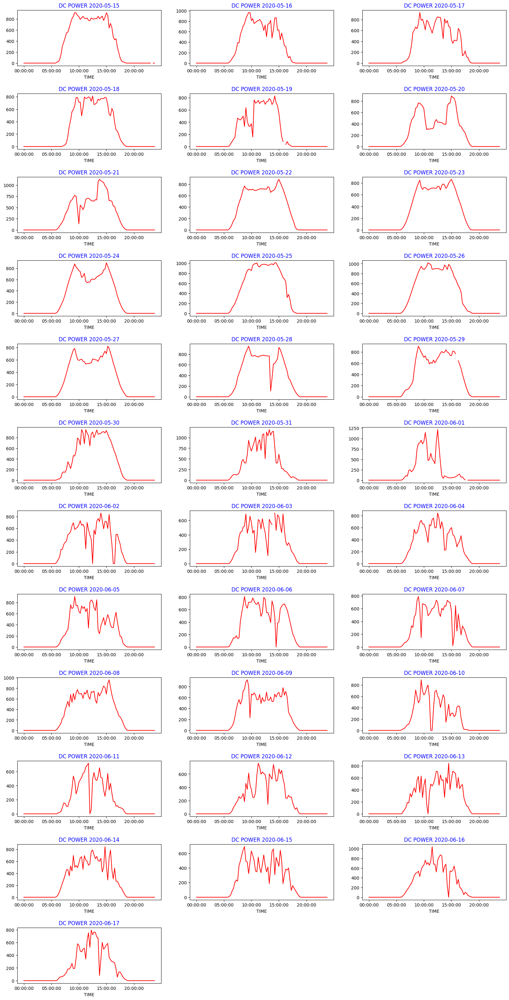

In [39]:
#MULTIPLE PLOTTING OF DC POWER WRT DAY BASIS
dcperday= data.pivot_table(index ="TIME", columns ="DATE", values= "DC_POWER")

def daywise_plot(data= None, row= None ,col= None, title="DC POWER"):
  cols= data.columns
  gp= plt.figure(figsize=(20,40))
  gp.subplots_adjust(wspace=0.2, hspace=0.5)
  for i in range(1, len(cols)+1):
    ax= gp.add_subplot(row,col,i)
    data[cols[i-1]].plot(ax= ax, color='red')
    ax.set_title("{} {}".format(title, cols[i-1]), color='blue')

daywise_plot(data= dcperday, row=12, col=3)

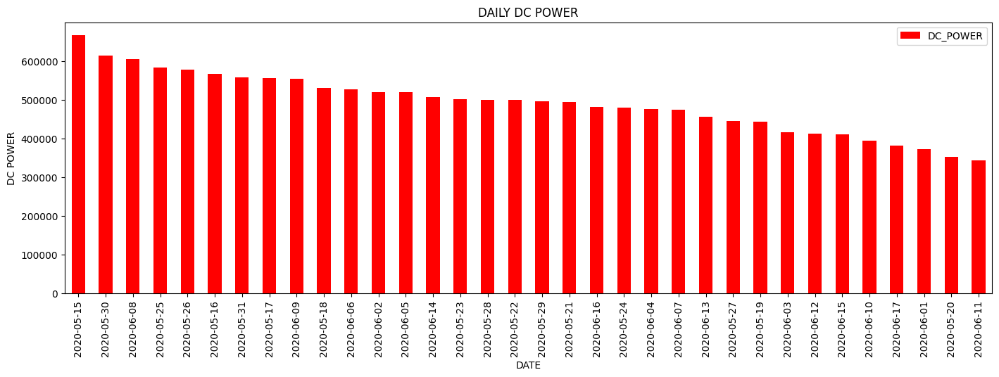

In [40]:
daily_dc = data.groupby('DATE')['DC_POWER'].agg('sum')
ax= daily_dc.sort_values(ascending= False).plot.bar(figsize =(17,5) ,legend= True, color= 'red')
plt.title('DAILY DC POWER')
plt.xlabel('DATE')
plt.ylabel('DC POWER')
plt.show()

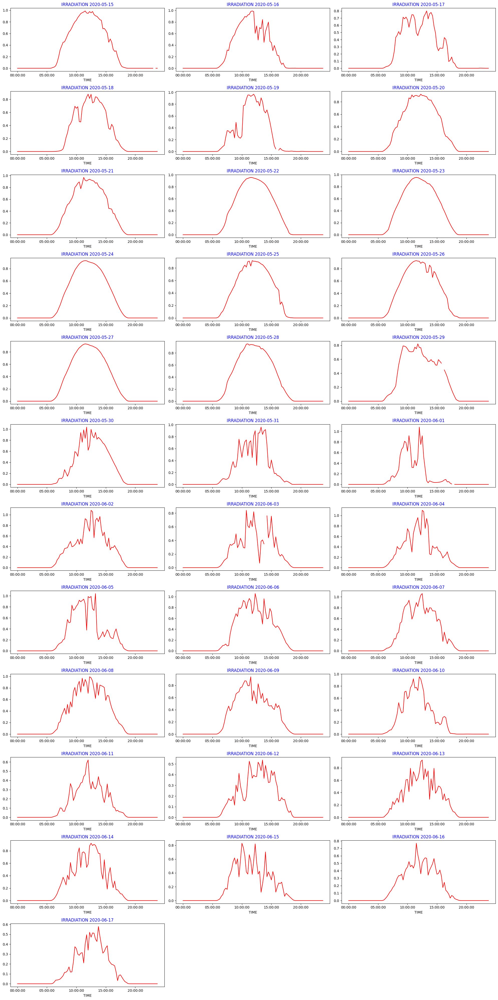

In [41]:
#MULTIPLE PLOTTING OF IRRADIATION PER DAY BASIS
irradperday= data.pivot_table(index ="TIME", columns ="DATE", values= "IRRADIATION")
def daywise_plot(data= None, row= None ,col= None, title="IRRADIATION"):
  cols= data.columns
  gp= plt.figure(figsize=(20,40))
  gp.subplots
  for i in range(1, len(cols)+1):
    ax= gp.add_subplot(row,col,i)
    data[cols[i-1]].plot(ax= ax, color='red')
    ax.set_title("{} {}".format(title, cols[i-1]), color='blue')
    plt.tight_layout()
daywise_plot(data= irradperday, row=12, col=3)


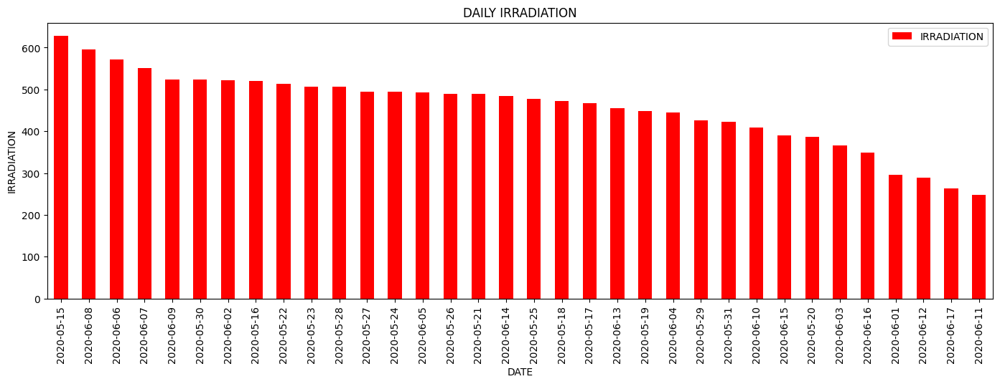

In [42]:

daily_irradiation=data.groupby('DATE')['IRRADIATION'].agg('sum')
ax= daily_irradiation.sort_values( ascending= False).plot.bar(figsize =(17,5) ,legend= True, color= 'red')
plt.title('DAILY IRRADIATION')
plt.xlabel('DATE')
plt.ylabel('IRRADIATION')
plt.show()



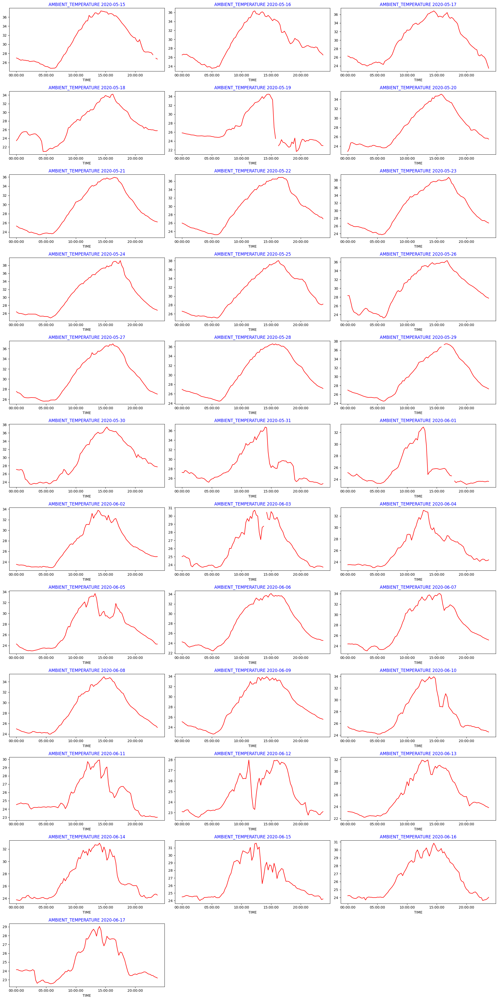

In [43]:
#MULTIPLE PLOTTING OF AMBIENT PER DAY BASIS
ambienttempperday= data.pivot_table(index ="TIME", columns ="DATE", values= "AMBIENT_TEMPERATURE")
def daywise_plot(data= None, row= None ,col= None, title="AMBIENT_TEMPERATURE"):
  cols= data.columns
  gp= plt.figure(figsize=(20,40))
  gp.subplots
  for i in range(1, len(cols)+1):
    ax= gp.add_subplot(row,col,i)
    data[cols[i-1]].plot(ax= ax, color='red')
    ax.set_title("{} {}".format(title, cols[i-1]), color='blue')
    plt.tight_layout()
daywise_plot(data= ambienttempperday, row=12, col=3)


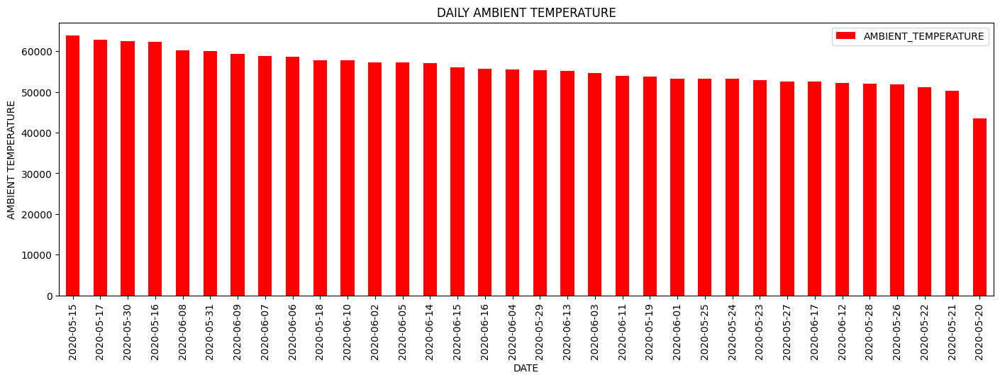

In [44]:
daily_ambient_temp=data.groupby('DATE')['AMBIENT_TEMPERATURE'].agg('sum')

ax= daily_ambient_temp.sort_values( ascending= False).plot.bar(figsize =(17,5) ,legend= True, color= 'red')
plt.title('DAILY AMBIENT TEMPERATURE')
plt.xlabel('DATE')
plt.ylabel('AMBIENT TEMPERATURE')
plt.show()


                    max , min output
dcdate            = [2020-05-25  ,  2020-05-18]

daily irradiation = [2020-05-20  ,  2020-05-08]

daily ambient     = [2020-05-24  ,  2020-05-21]


Solar inverter efficiency

In [45]:
data.head()

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,DATE,TIME,DAY,MONTH,WEEK,HOURS,MINUTES,TOTAL MINUTES PASS,SOURCE_KEY_NUMBER,DAY_OF_WEEK
DATE_STRING,,,,,,,,,,,,,,,,,,,
2020-05-15,2020-05-15,4UPUqMRk7TRMgml,0.0,0.0,9425.000000,2.429011e+06,27.004764,25.060789,0.0,2020-05-15,00:00:00,2020-05-15,5,20,0,0,0,0,5
2020-05-15,2020-05-15,81aHJ1q11NBPMrL,0.0,0.0,0.000000,1.215279e+09,27.004764,25.060789,0.0,2020-05-15,00:00:00,2020-05-15,5,20,0,0,0,1,5
2020-05-15,2020-05-15,9kRcWv60rDACzjR,0.0,0.0,3075.333333,2.247720e+09,27.004764,25.060789,0.0,2020-05-15,00:00:00,2020-05-15,5,20,0,0,0,2,5
2020-05-15,2020-05-15,Et9kgGMDl729KT4,0.0,0.0,269.933333,1.704250e+06,27.004764,25.060789,0.0,2020-05-15,00:00:00,2020-05-15,5,20,0,0,0,3,5
2020-05-15,2020-05-15,IQ2d7wF4YD8zU1Q,0.0,0.0,3177.000000,1.994153e+07,27.004764,25.060789,0.0,2020-05-15,00:00:00,2020-05-15,5,20,0,0,0,4,5


In [46]:
solar_dc_power = data[data['DC_POWER'] > 0]["DC_POWER"].values
solar_ac_power = data[data['AC_POWER'] > 0]["AC_POWER"].values
solar_eff= (np.max(solar_ac_power)/np.max(solar_dc_power))*100
print(f"Solar Inverter Efficiency: {solar_eff:.3f}%")

Solar Inverter Efficiency: 97.501%


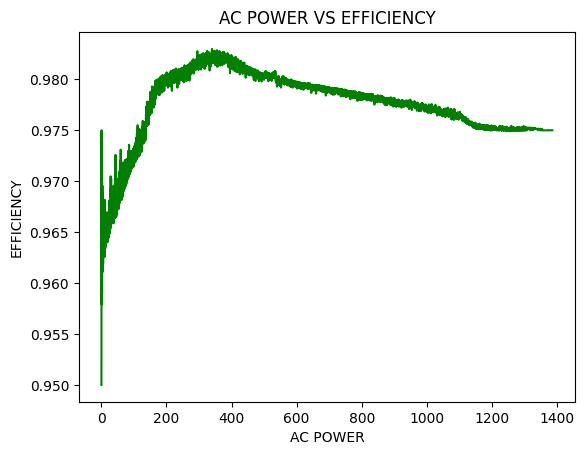

In [47]:
ac_power= []
dc_power= []
for i in data["AC_POWER"]:
  if i > 0:
    ac_power.append(i)
for i in data["DC_POWER"]:
  if i > 0:
    dc_power.append(i)

ac_power.sort()
dc_power.sort()
Efficiency= [i/j for i,j in zip(ac_power, dc_power)]
plt.plot(ac_power, Efficiency, color='green')
plt.title("AC POWER VS EFFICIENCY")
plt.xlabel("AC POWER")
plt.ylabel("EFFICIENCY")
plt.show()


PREDICTION

In [48]:
data[data.isnull().any(axis=1)]

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,DATE,TIME,DAY,MONTH,WEEK,HOURS,MINUTES,TOTAL MINUTES PASS,SOURCE_KEY_NUMBER,DAY_OF_WEEK
DATE_STRING,,,,,,,,,,,,,,,,,,,


In [49]:
data.dropna(inplace=True)

In [50]:
data.head()

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,DATE,TIME,DAY,MONTH,WEEK,HOURS,MINUTES,TOTAL MINUTES PASS,SOURCE_KEY_NUMBER,DAY_OF_WEEK
DATE_STRING,,,,,,,,,,,,,,,,,,,
2020-05-15,2020-05-15,4UPUqMRk7TRMgml,0.0,0.0,9425.000000,2.429011e+06,27.004764,25.060789,0.0,2020-05-15,00:00:00,2020-05-15,5,20,0,0,0,0,5
2020-05-15,2020-05-15,81aHJ1q11NBPMrL,0.0,0.0,0.000000,1.215279e+09,27.004764,25.060789,0.0,2020-05-15,00:00:00,2020-05-15,5,20,0,0,0,1,5
2020-05-15,2020-05-15,9kRcWv60rDACzjR,0.0,0.0,3075.333333,2.247720e+09,27.004764,25.060789,0.0,2020-05-15,00:00:00,2020-05-15,5,20,0,0,0,2,5
2020-05-15,2020-05-15,Et9kgGMDl729KT4,0.0,0.0,269.933333,1.704250e+06,27.004764,25.060789,0.0,2020-05-15,00:00:00,2020-05-15,5,20,0,0,0,3,5
2020-05-15,2020-05-15,IQ2d7wF4YD8zU1Q,0.0,0.0,3177.000000,1.994153e+07,27.004764,25.060789,0.0,2020-05-15,00:00:00,2020-05-15,5,20,0,0,0,4,5


In [51]:
data.columns

Index(['DATE_TIME', 'SOURCE_KEY', 'DC_POWER', 'AC_POWER', 'DAILY_YIELD',
       'TOTAL_YIELD', 'AMBIENT_TEMPERATURE', 'MODULE_TEMPERATURE',
       'IRRADIATION', 'DATE', 'TIME', 'DAY', 'MONTH', 'WEEK', 'HOURS',
       'MINUTES', 'TOTAL MINUTES PASS', 'SOURCE_KEY_NUMBER', 'DAY_OF_WEEK'],
      dtype='object')

In [52]:
df= data.copy()
X= df[['DC_POWER', 'DAILY_YIELD',
       'TOTAL_YIELD', 'AMBIENT_TEMPERATURE', 'MODULE_TEMPERATURE',
       'IRRADIATION','DAY_OF_WEEK','SOURCE_KEY_NUMBER']]

y= df['AC_POWER']

In [53]:
X.head()

,DC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,DAY_OF_WEEK,SOURCE_KEY_NUMBER
DATE_STRING,,,,,,,,
2020-05-15,0.0,9425.000000,2.429011e+06,27.004764,25.060789,0.0,5,0
2020-05-15,0.0,0.000000,1.215279e+09,27.004764,25.060789,0.0,5,1
2020-05-15,0.0,3075.333333,2.247720e+09,27.004764,25.060789,0.0,5,2
2020-05-15,0.0,269.933333,1.704250e+06,27.004764,25.060789,0.0,5,3
2020-05-15,0.0,3177.000000,1.994153e+07,27.004764,25.060789,0.0,5,4


In [54]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [55]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
lr= LinearRegression()
lr.fit(X_train, y_train)
y_pred= lr.predict(X_test)
mse= mean_squared_error(y_test, y_pred)
r2= r2_score(y_test, y_pred)

In [56]:
r2

0.9999941746114027

In [57]:
cross_checking = pd.DataFrame({'Actual' : y_test , 'Predicted' : y_pred})
cross_checking.head()

,Actual,Predicted
DATE_STRING,,
2020-05-28,1063.557143,1065.468834
2020-06-16,724.826667,723.945512
2020-05-17,0.000000,0.407723
2020-05-21,0.000000,0.217984
2020-06-05,0.000000,0.166296


TO PREDICT FAULTY ONE

to predict next couple day power

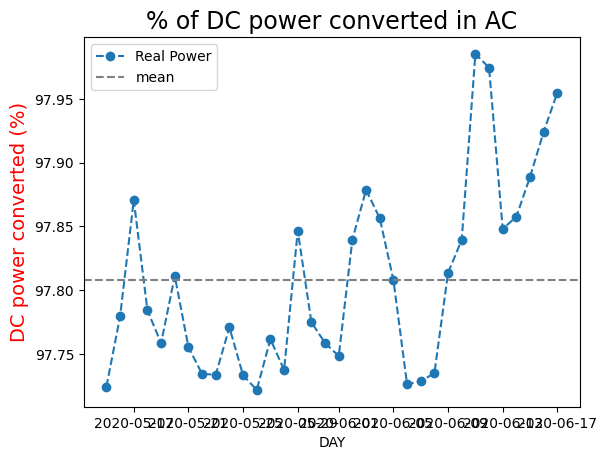

In [58]:
#inefficient inverters
losses= data.copy()
losses["DAY"]= losses["DATE_TIME"].dt.date
losses= losses.groupby("DAY").sum(numeric_only=True)
losses["losses"]= losses["AC_POWER"]/losses["DC_POWER"]*100

losses['losses'].plot(style='o--', label='Real Power')

plt.title("% of DC power converted in AC", size= 17)
plt.ylabel("DC power converted (%)", fontsize= 14, color= "red")
plt.axhline(losses["losses"].mean(), linestyle= "--", color= "gray", label= "mean")
plt.legend()
plt.show()


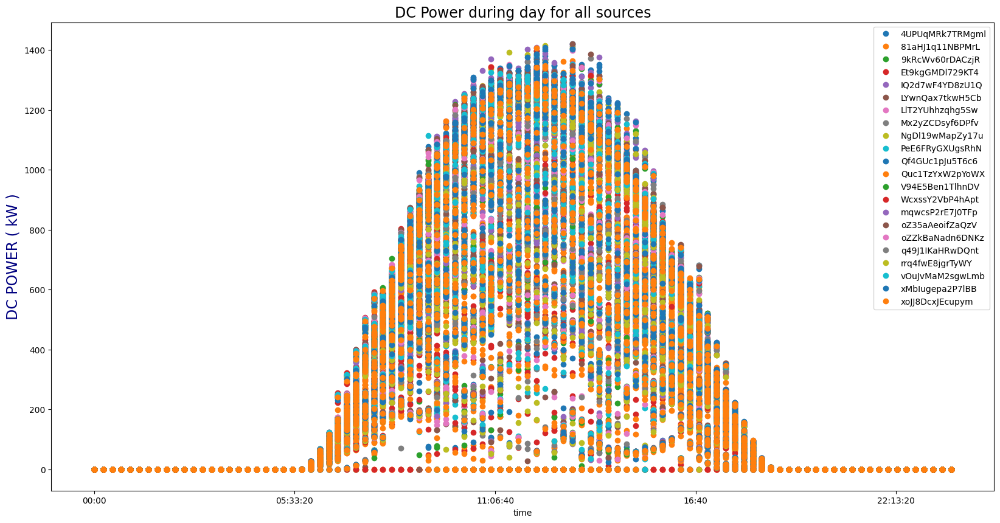

In [59]:
sources=data.copy()
sources['time']=sources['DATE_TIME'].dt.time
sources.set_index('time').groupby('SOURCE_KEY')['DC_POWER'].plot(style='o',legend=True,figsize=(20,10))
plt.title('DC Power during day for all sources',size=17)
plt.ylabel('DC POWER ( kW )',color='navy',fontsize=17)
plt.show()

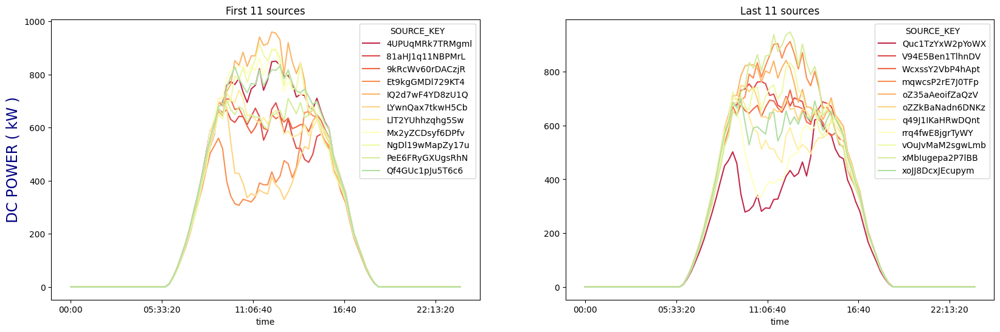

In [60]:
dc_gen=data.copy()
dc_gen['time']=dc_gen['DATE_TIME'].dt.time
dc_gen=dc_gen.groupby(['time','SOURCE_KEY'])['DC_POWER'].mean().unstack()

cmap = sns.color_palette("Spectral", n_colors=15)

fig,ax=plt.subplots(ncols=2,nrows=1,dpi=100,figsize=(20,6))
dc_gen.iloc[:,0:11].plot(ax=ax[0],color=cmap)
dc_gen.iloc[:,11:22].plot(ax=ax[1],color=cmap)

ax[0].set_title('First 11 sources')
ax[0].set_ylabel('DC POWER ( kW )',fontsize=17,color='navy')
ax[1].set_title('Last 11 sources')
plt.show()

In [66]:
!pip install pmdarima


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 15.1 MB/s eta 0:00:00


In [67]:
#FORECAST
#auto_arima fuction to predict
from pandas.tseries.offsets import DateOffset



from pmdarima.arima import auto_arima
from statsmodels.tsa.stattools import adfuller

Many forecasting models (like ARIMA) require the time series data to be stationary. If the series is non-stationary, you may need to transform it (e.g., by differencing) to achieve stationarity.


Detecting Trends and Seasonality: The ADF test helps you identify whether your series has trends or seasonality, which are characteristics of non-stationary data.


Preparing Data for Time Series Forecasting: Without stationarity, statistical models like ARIMA may give biased forecasts. Thus, checking for stationarity using the ADF test is an essential step in the data preprocessing pipeline.

Example of Using the ADF Test:

Non-Stationary Data: For instance, if you have monthly sales data that shows an upward trend, the ADF test might indicate that the series is non-stationary due to the trend.

In this case, you would differ the data (subtract each data point from the previous one) to remove the trend and then rerun the ADF test to check if the series has become stationary.

Stationary Data: If you have a time series of daily temperature readings over a short period (e.g., one month), the ADF test may show that the series is stationary, and no transformation would be needed for modeling.

Stationary data refers to data whose statistical properties, such as mean and variance, do not change over time. This can apply to data collected at regular intervals (like daily, weekly, monthly) or at irregular intervals. The key idea is that the data’s statistical characteristics remain constant over time.

So, when we say stationary data, it means:

Constant mean: The average value of the data does not change over time.
Constant variance: The spread (or variability) of the data is consistent across different time periods.
Constant autocovariance: The relationship between values at different time points (lags) remains unchanged over time.
Important Points:
Regular Intervals: Data can be collected at regular intervals (like every day, every hour, etc.), but stationarity refers to the behavior of the data's statistical properties over time, not the collection frequency. Regular intervals make time series analysis easier but are not a requirement for stationarity.

Stationarity vs. Regularity: While stationarity refers to the consistency of the statistical properties, regularity (data collected at regular intervals) refers to the timing of the data collection. Data can be stationary whether it is collected at regular intervals or not.

In [63]:
#PRE ARIMA

pred_ = data.copy()
pred_["DATE_TIME"]= pd.to_datetime(pred_["DATE_TIME"])

pred_ = pred_.groupby("DATE_TIME")["DAILY_YIELD"].sum()
pred_= pred_[-288:].reset_index()
pred_.set_index("DATE_TIME", inplace=True)

pred_.head(15)

,DAILY_YIELD
DATE_TIME,
2020-06-15 00:00:00,95945.6
2020-06-15 00:15:00,92668.0
2020-06-15 00:30:00,92668.0
2020-06-15 00:45:00,92668.0
2020-06-15 01:00:00,92668.0
2020-06-15 01:15:00,92668.0
2020-06-15 01:30:00,92668.0
2020-06-15 01:45:00,92668.0
2020-06-15 02:00:00,92668.0


In [64]:
pred_.describe()


,DAILY_YIELD
count,288.000000
mean,63204.567014
std,39475.341692
min,0.000000
25%,22633.610714
50%,73875.000000
75%,93040.000000
max,115759.000000


In [68]:
result= adfuller(pred_["DAILY_YIELD"])
print(f"ADF Statistic: {result[0]}")
print(f"p-value: {result[1]}")
print(f"Critical Values:")
for key, value in result[4].items():
    print(f"\t{key}: {value}")
if result[1] <=0.05:
    print("Reject the null hypothesis (H0). The series is stationary.")
else:
    print("Fail to reject the null hypothesis (H0). The series is non-stationary.")

ADF Statistic: -2.140358502177895
p-value: 0.22859881999203613
Critical Values:
	1%: -3.4535050041524245
	5%: -2.8717352599720294
	10%: -2.5722024776854417
Fail to reject the null hypothesis (H0). The series is non-stationary.


to make data stationary


ARIMA (AutoRegressive Integrated Moving Average) models are particularly useful for non-stationary data. The "I" in ARIMA refers to the Integrated part, which means differencing the data to make it stationary.

ARIMA models can be used to forecast data even when it's non-stationary, as the model accounts for trends and seasonality.
Steps in ARIMA:

Differencing to make the data stationary.
Auto-regression (AR) to model the relationship between an observation and a number of lagged observations.

Moving Average (MA) to model the relationship between an observation and a residual error from a moving average model applied to lagged observations.

In [69]:
#ARIMA
from sklearn.model_selection import train_test_split
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error



In [ ]:
288/3

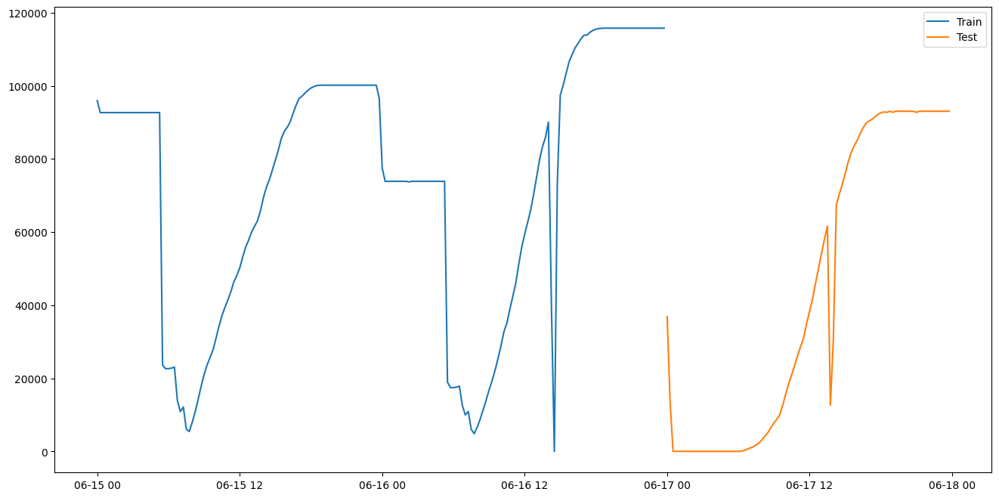

In [70]:
train= pred_[:192]
test= pred_[192:]
plt.figure(figsize=(16,8))
plt.plot(train, label='Train')
plt.plot(test, label='Test')
plt.legend(loc='best')
plt.show()

In [71]:
import warnings
warnings.filterwarnings("ignore")

In [72]:
arima_model= auto_arima(train,
                   start_p=0,d=1,start_q=0,
                   max_p=4, max_d=4, max_q=4,
                   start_P=0, D=1,start_Q=0,
                   max_P=1, max_D=1,max_Q=1,
                   m=96,
                   error_action= 'warn', trace= True,
                   supress_warning= True ,stepwise= True,
                   random_state=20, n_fits= 1)
arima_model

Performing stepwise search to minimize aic


KeyboardInterrupt: 

In [ ]:
2910/()

In [ ]:
194

In [ ]:
future_dates= [test.index[-1] + DateOffset(hours=x)for x in range(0,2910,15) ]        #number of hours in increments of 15 hours.

In [ ]:
#a dataframe

'''
prediction= pd.DataFrame(arima_model.predict(n_periods=2910), index= test.index)
prediction.columns= ['Predicted Value']

fig,ax= plt.subplots(ncols=2,nrows=1,dpi=100,figsize=(17,5))
ax[0].plot(train,label='Train',color='navy')
ax[0].plot(test,label='Test',color='darkorange')
ax[0].plot(prediction,label='Prediction',color='green')
ax[0].legend()
ax[0].set_title('Forecast on test set',size=17)
ax[0].set_ylabel('kW',color='navy',fontsize=17)


f_prediction=pd.DataFrame(arima_model.predict(n_periods=194),index=future_dates)
f_prediction.columns=['predicted_yield']
ax[1].plot(pred_gen,label='Original data',color='navy')
ax[1].plot(f_prediction,label='18th & 19th June',color='green')
ax[1].legend()
ax[1].set_title('Next days forecast',size=17)
plt.show()'''

# too costly to system

PROPHET BY META

Prophet is a procedure for forecasting time series data based on an additive model where non-linear trends are fit with yearly, weekly, and daily seasonality, plus holiday effects.

It works best with time series that have strong seasonal effects and several seasons of historical data. Prophet is robust to missing data and shifts in the trend, and typically handles outliers well.

One of the advantages of is that can be much more faster then ARIMA procedure of forecasting,especially when you're dealing with a long time series, such as our case, but we must take into account that this metodology in under development and not fully stable.

In [73]:
from prophet import Prophet

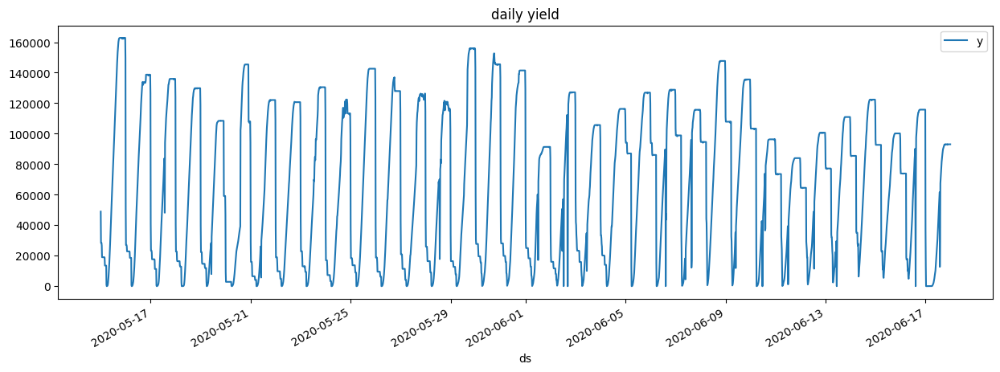

In [74]:
pred_ = data.copy()
pred_["DATE_TIME"]= pd.to_datetime(pred_["DATE_TIME"])

pred_ = pred_.groupby("DATE_TIME")["DAILY_YIELD"].sum().reset_index()
pred_.columns= ["ds", "y"]
pred_.plot(x= "ds", y= "y", figsize= (15,5))
plt.legend()
plt.title("daily yield")
plt.show()

In [75]:
model= Prophet()
model.fit(pred_)
future= [pred_['ds'].iloc[-1:] + DateOffset(minutes=x) for x in range(0,2910,15) ]
time1= pd.DataFrame(future).reset_index().drop("index", axis=1)
time1.columns= ["ds"]
time1.head()

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3ptuknpw/sm6pjy21.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp3ptuknpw/_y6yedxr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=1240', 'data', 'file=/tmp/tmp3ptuknpw/sm6pjy21.json', 'init=/tmp/tmp3ptuknpw/_y6yedxr.json', 'output', 'file=/tmp/tmp3ptuknpw/prophet_model6bwjzut1/prophet_model-20241224133230.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:32:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:32:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


,ds
0,2020-06-17 23:45:00
1,2020-06-18 00:00:00
2,2020-06-18 00:15:00
3,2020-06-18 00:30:00
4,2020-06-18 00:45:00


In [76]:
timeline= pd.DataFrame(pred_['ds'])
fut= pd.concat([timeline, time1], ignore_index= True) # Use pd.concat instead of append
fut.tail()


,ds
3448,2020-06-19 23:00:00
3449,2020-06-19 23:15:00
3450,2020-06-19 23:30:00
3451,2020-06-19 23:45:00
3452,2020-06-20 00:00:00


In [77]:
forecast= model.predict(fut)

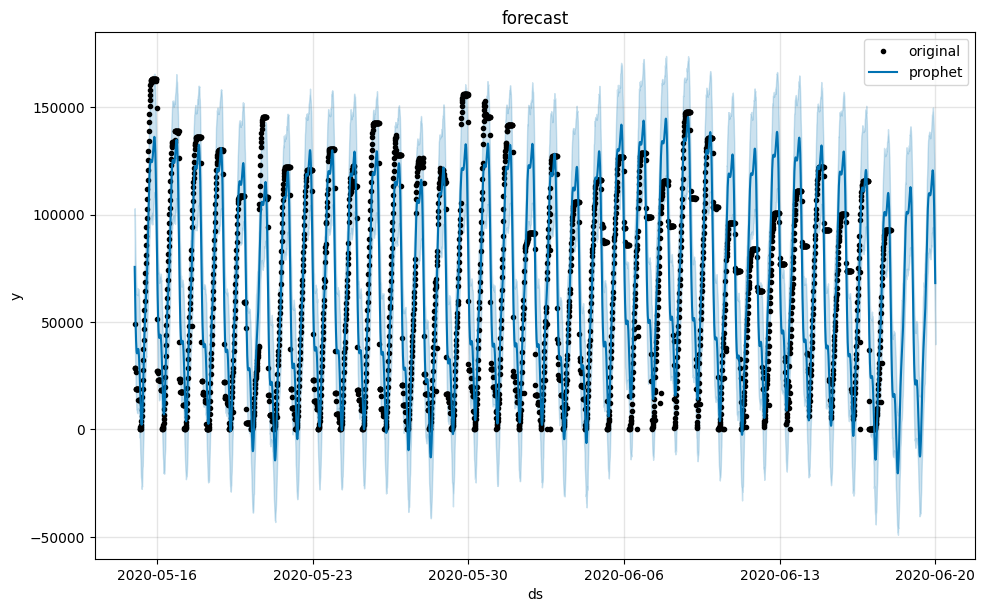

In [78]:
model.plot(forecast)
plt.title("forecast")
plt.legend(labels=['original' ,"prophet"])
plt.show()

In [79]:
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
test2=pd.DataFrame(test.index)
test2.rename(columns={'DATE_TIME':'ds'},inplace=True)
test_prophet=model.predict(test2)

In [80]:
test_prophet.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2020-06-17 00:00:00,60901.961961,39100.662016,96008.810672,60901.961961,60901.961961,5782.810473,5782.810473,5782.810473,9195.742789,9195.742789,9195.742789,-3412.932316,-3412.932316,-3412.932316,0.0,0.0,0.0,66684.772434
1,2020-06-17 00:15:00,60875.292501,30549.990504,89081.371165,60875.292501,60875.292501,-1765.878308,-1765.878308,-1765.878308,1748.185717,1748.185717,1748.185717,-3514.064025,-3514.064025,-3514.064025,0.0,0.0,0.0,59109.414193
2,2020-06-17 00:30:00,60848.623041,23452.000929,79537.356116,60848.623041,60848.623041,-8899.571936,-8899.571936,-8899.571936,-5284.153357,-5284.153357,-5284.153357,-3615.418579,-3615.418579,-3615.418579,0.0,0.0,0.0,51949.051106
3,2020-06-17 00:45:00,60821.953581,15923.122199,72758.043244,60821.953581,60821.953581,-15421.345727,-15421.345727,-15421.345727,-11704.369683,-11704.369683,-11704.369683,-3716.976044,-3716.976044,-3716.976044,0.0,0.0,0.0,45400.607854
4,2020-06-17 01:00:00,60795.284121,11797.299956,69194.313104,60795.284121,60795.284121,-21170.564422,-21170.564422,-21170.564422,-17351.848226,-17351.848226,-17351.848226,-3818.716196,-3818.716196,-3818.716196,0.0,0.0,0.0,39624.719700


In [81]:
print('Prophet R2 Score: %f' % (r2_score(test['DAILY_YIELD'],test_prophet['yhat'])))
print('-'*15)

print('Prophet MAE Score: %f' % (mean_absolute_error(test['DAILY_YIELD'],test_prophet['yhat'])))
print('-'*15)

print('Prophet RMSE Score: %f' % (np.sqrt(mean_squared_error(test['DAILY_YIELD'],test_prophet['yhat']))))

Prophet R2 Score: 0.808225
---------------
Prophet MAE Score: 13607.828329
---------------
Prophet RMSE Score: 17635.084750
